# Packages

In [ ]:
import os 
import warnings

import re
import unidecode

import json 
import time 

import datetime as dt

import numpy as np 
import pandas as pd 

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 

import matplotlib.colors as mcolors # // matplotlib.colors.Normalize
import matplotlib.cm as cm # // https://matplotlib.org/stable/users/explain/colors/colormap-manipulation.html#colormap-manipulation
from matplotlib.colors import LinearSegmentedColormap # for Custom CMAP
import folium

import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS
from statsmodels.stats.outliers_influence import variance_inflation_factor # https://www.geeksforgeeks.org/detecting-multicollinearity-with-vif-python/

from collections import Counter

from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler

warnings.filterwarnings("ignore")

path = "teste_indicium_precificacao.csv"
div = 80*"-"

# Loading From file

In [2]:
# df will be our raw Pandas DataFrame until we remove all instances of "price equals 0".
df = pd.read_csv(path, index_col= [0])
df.ultima_review = pd.to_datetime(df.ultima_review) # Change the date from String to Timestamp
display(df.head().T)

raw = df.copy()

id,2595,3647,3831,5022,5099
nome,Skylit Midtown Castle,THE VILLAGE OF HARLEM....NEW YORK !,Cozy Entire Floor of Brownstone,Entire Apt: Spacious Studio/Loft by central park,Large Cozy 1 BR Apartment In Midtown East
host_id,2845,4632,4869,7192,7322
host_name,Jennifer,Elisabeth,LisaRoxanne,Laura,Chris
bairro_group,Manhattan,Manhattan,Brooklyn,Manhattan,Manhattan
bairro,Midtown,Harlem,Clinton Hill,East Harlem,Murray Hill
latitude,40.75362,40.80902,40.68514,40.79851,40.74767
longitude,-73.98377,-73.9419,-73.95976,-73.94399,-73.975
room_type,Entire home/apt,Private room,Entire home/apt,Entire home/apt,Entire home/apt
price,225,150,89,80,200
minimo_noites,1,3,1,10,3


## Check price and location

### Check for negative prices, min and max.

In [3]:
sortedByPrice = df[
    ["latitude", "longitude", "price"]
].sort_values("price")

display(sortedByPrice)

print(sortedByPrice.price.min(), sortedByPrice.price.max(), sep = ", ")

auxSortedByPrice = sortedByPrice.copy()
auxSortedByPrice["price"]  = sortedByPrice.price/(sortedByPrice.price.max())
display(auxSortedByPrice)

,latitude,longitude,price
id,,,
20639914,40.68258,-73.91284,0
20333471,40.83296,-73.88668,0
20624541,40.70838,-73.94645,0
20608117,40.72462,-73.94072,0
21304320,40.69166,-73.90928,0
...,...,...,...
9528920,40.71355,-73.98507,9999
4737930,40.79264,-73.93898,9999
7003697,40.76810,-73.91651,10000


0, 10000


,latitude,longitude,price
id,,,
20639914,40.68258,-73.91284,0.0000
20333471,40.83296,-73.88668,0.0000
20624541,40.70838,-73.94645,0.0000
20608117,40.72462,-73.94072,0.0000
21304320,40.69166,-73.90928,0.0000
...,...,...,...
9528920,40.71355,-73.98507,0.9999
4737930,40.79264,-73.93898,0.9999
7003697,40.76810,-73.91651,1.0000


### Check locations

In [4]:
def getColorWithCustomMinMax(value, minPrice, maxPrice):
    # Making sure the values make sense
    minPrice = min(minPrice, maxPrice)
    maxPrice = max(minPrice, maxPrice)

    # Pick Red/Blue Shades
    # cmap = cm.get_cmap('coolwarm')
    cmap = LinearSegmentedColormap.from_list("BlueRed", ["blue", "red"])

    # Normalize object from mpl
    norm = mcolors.Normalize(
        minPrice, # min (if 0, the white from the markers is harder to see)
        maxPrice  # max
    )
    rgba = cmap(norm(value))  # // RGB com cm
    return mcolors.to_hex(rgba)  # needs fix: Folium with Hex


def getCircleMarkersListWith0To1NormalizedDF(df: pd.DataFrame):

    minPrice = df.price.min()
    maxPrice = df.price.max()

    positionPrices = [ # List of CircleMarkers
        folium.CircleMarker(
            location = [row.latitude, row.longitude],
            radius = 8,  # Marker size
            color = getColorWithCustomMinMax(row.price, 0, 1),
            popup = f"{row.price}"
        )
        for ind, row in df.iterrows()
    ]

    return positionPrices

def getCircleMarkersListWithCustomgetColor(df: pd.DataFrame):

    minPrice = df.price.min()
    maxPrice = df.price.max()

    positionPrices = [ # List of CircleMarkers
        folium.CircleMarker(
            location = [row.latitude, row.longitude],
            radius = 8,  # Marker size
            color = getColorWithCustomMinMax(row.price, minPrice, maxPrice),
            popup = f"{row.price}"
        )
        for ind, row in df.iterrows()
    ]

    return positionPrices

def getMapFromListOfCircleMaps(listOfCircleMarkers: list):
    
    map = folium.Map() # Initialize Map

    # Add CircleMarkers to map
    for circleMarker in listOfCircleMarkers:
        # map.addCircleMarker(circleMarker)
        circleMarker.add_to(map)
    
    return map


def displayMap0To1(df: pd.DataFrame):

    # Square of data
    laMin, laMax = df.latitude.min(), df.latitude.max()
    loMin, loMax = df.longitude.min(), df.longitude.max()

    listOfCircleMarkers = getCircleMarkersListWith0To1NormalizedDF(df) # Generate CircleMarkers
    map = getMapFromListOfCircleMaps(listOfCircleMarkers) # Load CircleMarkers into Map

    # Zoom in the data
    map.fit_bounds(
        [
            [laMin, loMin],
            [laMax, loMax]
        ]
    )
    
    return map


def displayMapWithCustomMinMax(df: pd.DataFrame):

    # Square of data
    laMin, laMax = df.latitude.min(), df.latitude.max()
    loMin, loMax = df.longitude.min(), df.longitude.max()

    listOfCircleMarkers = getCircleMarkersListWithCustomgetColor(df) # Generate CircleMarkers
    map = getMapFromListOfCircleMaps(listOfCircleMarkers) # Load CircleMarkers into Map

    # Zoom in the data
    map.fit_bounds(
        [
            [laMin, loMin],
            [laMax, loMax]
        ]
    )
    
    return map

def normalizedDfByColumn(df: pd.DataFrame, column = pd.DataFrame.columns):
    maxAbs = float()
    maxAbs = abs(df[column]).max()


    

display(displayMap0To1(auxSortedByPrice.sample(n = 1000, random_state = 42))) # Show a small sample while we save the Data)

print("Cheapest")
display(displayMap0To1(auxSortedByPrice.head(100))) # 100 cheapest
print("Most Expensive")
display(displayMap0To1(auxSortedByPrice.tail(100))) # 100 most expensive

# displayMapWithCustomMinMax(auxSortedByPrice).save("Manh.html") # Saving the full data

# displayMapWithCustomMinMax(
#     auxSortedByPrice.apply(
#         lambda x: x.apply(
#             lambda y: np.log((y*(np.e-1)) + 1) # Same data, with log
#             if x.name == "price" else y))
#     ).save("ManhLog.html")


Cheapest


Most Expensive


The complete map is as follows:

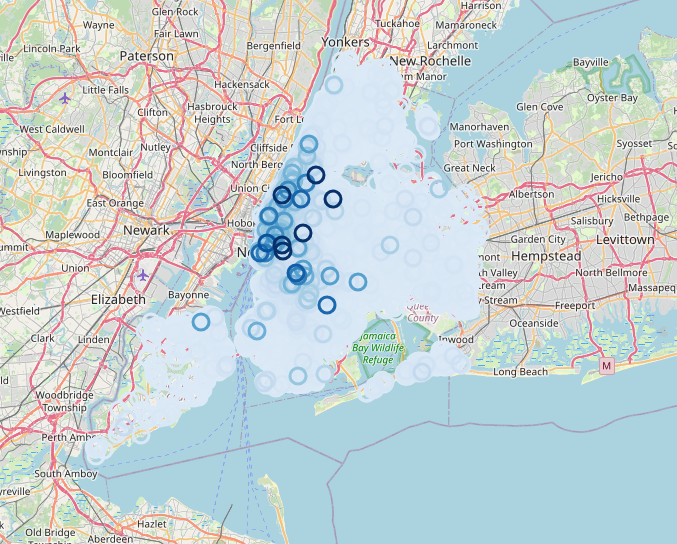

With log:

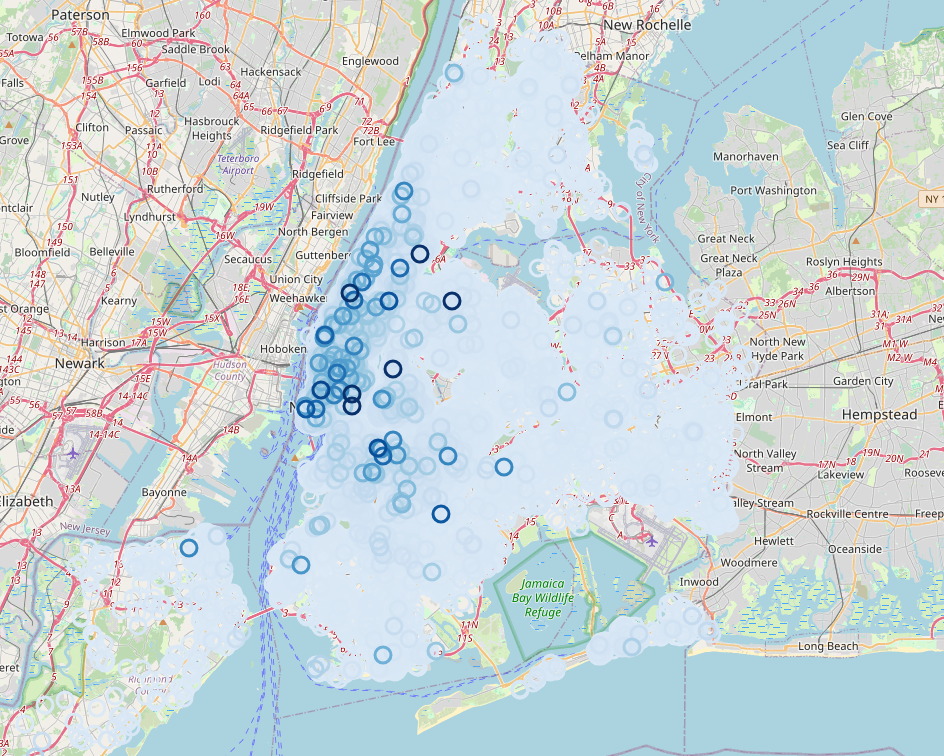

# Maps grouped by major/minor districts an price

## Major districts
Grouping data by the major districts (Bronx, Brooklyn, Manhattan, Queens and Staten Island), we can check the min, max, mean and median of the prices offered by the hotels, as well as the variation of price (in terms of std).

As we can see, <font color = "tomato"> Manhattan </font> clearly has the largest mean and median price, as well as the largest variation in prices.

Staten Island shows a price variation similar to that of Manhattan, even though its range (min/max interval) is smaller and its mean price is about half of Manhattan’s. This <font color = "tomato"> suggests that the distribution of prices in Staten Island is more dispersed </font>.

In [5]:
# By major district:
includeDistrict = pd.merge(left= auxSortedByPrice, right= df.bairro_group, left_index= True, right_index= True)

maj = includeDistrict.query("price > 0").groupby("bairro_group")

for func in ["mean", "max", "min", "median", "std"]:
    print(func.capitalize())
    curMaj = maj.agg(
        {
            "latitude": "mean", 
            "longitude": "mean", 
            "price": func
        }
    )
    display(curMaj)
    display(displayMapWithCustomMinMax(curMaj))


Mean


,latitude,longitude,price
bairro_group,,,
Bronx,40.848319,-73.884550,0.008758
Brooklyn,40.685034,-73.951201,0.012444
Manhattan,40.765063,-73.974607,0.019688
Queens,40.731531,-73.872775,0.009952
Staten Island,40.610225,-74.105805,0.011481


Max


,latitude,longitude,price
bairro_group,,,
Bronx,40.848319,-73.884550,0.25
Brooklyn,40.685034,-73.951201,1.00
Manhattan,40.765063,-73.974607,1.00
Queens,40.731531,-73.872775,1.00
Staten Island,40.610225,-74.105805,0.50


Min


,latitude,longitude,price
bairro_group,,,
Bronx,40.848319,-73.884550,0.0010
Brooklyn,40.685034,-73.951201,0.0010
Manhattan,40.765063,-73.974607,0.0010
Queens,40.731531,-73.872775,0.0010
Staten Island,40.610225,-74.105805,0.0013


Median


,latitude,longitude,price
bairro_group,,,
Bronx,40.848319,-73.884550,0.0065
Brooklyn,40.685034,-73.951201,0.0090
Manhattan,40.765063,-73.974607,0.0150
Queens,40.731531,-73.872775,0.0075
Staten Island,40.610225,-74.105805,0.0075


Std


,latitude,longitude,price
bairro_group,,,
Bronx,40.848319,-73.884550,0.010673
Brooklyn,40.685034,-73.951201,0.018690
Manhattan,40.765063,-73.974607,0.029139
Queens,40.731531,-73.872775,0.016710
Staten Island,40.610225,-74.105805,0.027762


## Minor districts


In [6]:
# By major district:
includeDistrict = pd.merge(left= auxSortedByPrice, right= df.bairro, left_index= True, right_index= True)

maj = includeDistrict.query("price > 0").groupby("bairro")

for func in ["mean", "max", "min", "median", "std"]:
    print(func.capitalize())
    curMaj = maj.agg(
        {
            "latitude": "mean", 
            "longitude": "mean", 
            "price": func
        }
    )
    display(curMaj)
    display(displayMapWithCustomMinMax(curMaj))


Mean


,latitude,longitude,price
bairro,,,
Allerton,40.865292,-73.858727,0.008760
Arden Heights,40.552410,-74.182253,0.006725
Arrochar,40.593900,-74.074600,0.011500
Arverne,40.591853,-73.794839,0.017178
Astoria,40.764299,-73.920002,0.011719
...,...,...,...
Windsor Terrace,40.654612,-73.977990,0.013899
Woodhaven,40.691968,-73.858232,0.006717
Woodlawn,40.897421,-73.867939,0.006009


Max


,latitude,longitude,price
bairro,,,
Allerton,40.865292,-73.858727,0.0450
Arden Heights,40.552410,-74.182253,0.0083
Arrochar,40.593900,-74.074600,0.0625
Arverne,40.591853,-73.794839,0.1500
Astoria,40.764299,-73.920002,1.0000
...,...,...,...
Windsor Terrace,40.654612,-73.977990,0.0450
Woodhaven,40.691968,-73.858232,0.0250
Woodlawn,40.897421,-73.867939,0.0085


Min


,latitude,longitude,price
bairro,,,
Allerton,40.865292,-73.858727,0.0033
Arden Heights,40.552410,-74.182253,0.0041
Arrochar,40.593900,-74.074600,0.0032
Arverne,40.591853,-73.794839,0.0035
Astoria,40.764299,-73.920002,0.0025
...,...,...,...
Windsor Terrace,40.654612,-73.977990,0.0038
Woodhaven,40.691968,-73.858232,0.0010
Woodlawn,40.897421,-73.867939,0.0029


Median


,latitude,longitude,price
bairro,,,
Allerton,40.865292,-73.858727,0.00665
Arden Heights,40.552410,-74.182253,0.00725
Arrochar,40.593900,-74.074600,0.00650
Arverne,40.591853,-73.794839,0.01250
Astoria,40.764299,-73.920002,0.00850
...,...,...,...
Windsor Terrace,40.654612,-73.977990,0.01230
Woodhaven,40.691968,-73.858232,0.00520
Woodlawn,40.897421,-73.867939,0.00680


Std


,latitude,longitude,price
bairro,,,
Allerton,40.865292,-73.858727,0.007305
Arden Heights,40.552410,-74.182253,0.001830
Arrochar,40.593900,-74.074600,0.013312
Arverne,40.591853,-73.794839,0.019335
Astoria,40.764299,-73.920002,0.034990
...,...,...,...
Windsor Terrace,40.654612,-73.977990,0.008463
Woodhaven,40.691968,-73.858232,0.004053
Woodlawn,40.897421,-73.867939,0.001982


# EDA

## Firstly, we check for nulls and non-unique values:
Also, we're excluding the data where price equals 0 (we're assuming it is an error).

In [7]:
df = df.query("price > 0")

print(df.info())

# Checking the unique values of the non-numerical
for col in df.select_dtypes(
    include="object"
    ).columns:
    
    print(div)
    numOfUniques = df[col].nunique()
    print(f"Uniques {col}s: {numOfUniques}")
    print(div)

    # Quick visual check for repeating values
    if numOfUniques <= 5: 

        for uni in df[col].unique():
            stringQuery = str()
            # stringQuery = f"{col} == '{uni}'"
            stringQuery = f"{col} == @uni" # @ because it has "'"
            slice = df.query(stringQuery)
            print(f"{uni}: {len(slice)}")

# Saving l so that we don't have to calculate it everytime
l = len(df)

# Displaying nulls and uniques.
for col in df.columns:
    print(div)
    uniques = df[col].nunique()
    nonNans = df[col].isna().sum()
    print(f"Uniques {col}s: {df[col].nunique()} out of {l};\t {'{:.2f}'.format(100*uniques/l)}% uniques, \t {'{:.2f}'.format(100*nonNans/l)} nonNans")

<class 'pandas.core.frame.DataFrame'>
Index: 48883 entries, 2595 to 36487245
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   nome                           48867 non-null  object        
 1   host_id                        48883 non-null  int64         
 2   host_name                      48862 non-null  object        
 3   bairro_group                   48883 non-null  object        
 4   bairro                         48883 non-null  object        
 5   latitude                       48883 non-null  float64       
 6   longitude                      48883 non-null  float64       
 7   room_type                      48883 non-null  object        
 8   price                          48883 non-null  int64         
 9   minimo_noites                  48883 non-null  int64         
 10  numero_de_reviews              48883 non-null  int64         
 11  ultima_review 

There seems to be a great concentration of nulls in the <font color = "tomato">review</font> data. If we plot it, we can check this information:

<Axes: ylabel='id'>

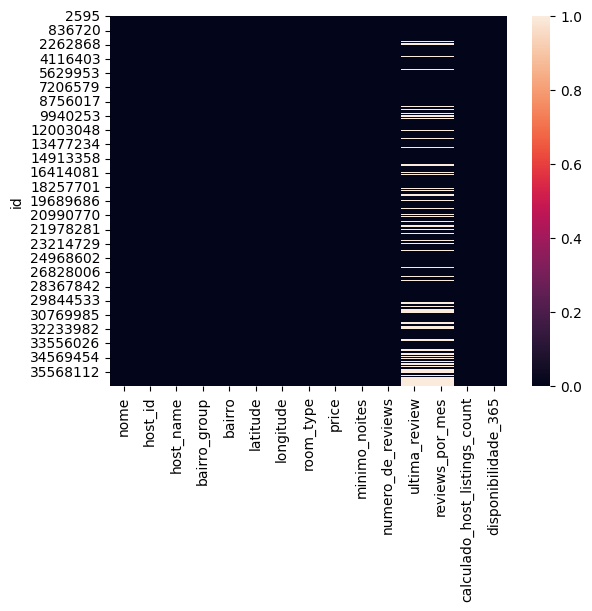

In [8]:
sns.heatmap(df.isna())

Since we'd like to work with numerical data, we will also normalize the "ultima_review" data to a date offset. For those hotels that never received a review, the value will be -1.

In [9]:
minDate, maxDate = df.ultima_review.min(), df.ultima_review.max()
aux = df.ultima_review.apply(lambda x: (x - minDate).days)
df["ultima_review_daysInt"] = (aux/(aux.max())).fillna(-1)

df.head().T

id,2595,3647,3831,5022,5099
nome,Skylit Midtown Castle,THE VILLAGE OF HARLEM....NEW YORK !,Cozy Entire Floor of Brownstone,Entire Apt: Spacious Studio/Loft by central park,Large Cozy 1 BR Apartment In Midtown East
host_id,2845,4632,4869,7192,7322
host_name,Jennifer,Elisabeth,LisaRoxanne,Laura,Chris
bairro_group,Manhattan,Manhattan,Brooklyn,Manhattan,Manhattan
bairro,Midtown,Harlem,Clinton Hill,East Harlem,Murray Hill
latitude,40.75362,40.80902,40.68514,40.79851,40.74767
longitude,-73.98377,-73.9419,-73.95976,-73.94399,-73.975
room_type,Entire home/apt,Private room,Entire home/apt,Entire home/apt,Entire home/apt
price,225,150,89,80,200
minimo_noites,1,3,1,10,3


In the raw data, we can check the largest and smallest price for the offers (namely, <font color = "tomato">$10 and $10000/night</font>)

In [10]:
df.sort_values("price").iloc[[0, -1]]

,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,ultima_review_daysInt
id,,,,,,,,,,,,,,,,
18490141,IT'S SIMPLY CONVENIENT!,97001292,Maria,Queens,Jamaica,40.69085,-73.79916,Entire home/apt,10,1,43,2019-06-12,1.68,1,252,0.991402
13894339,Luxury 1 bedroom apt. -stunning Manhattan views,5143901,Erin,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,2017-07-27,0.16,1,0,0.764881


Since room_type, bairro and bairro_group are very important data loaded in Strings, we'll need to convert them. 

room_type can be ranked by comfort:

<i>room_type_mapping = {<br>
"Entire home/apt": 2,<br>
"Private room": 1,<br>
"Shared room": 0<br>
}</i>

For bairro_group, however, since we can't rank the major districts, we'll create boolean variables "isManhattan", "isBrooklyn", "isQueens", "isStatenIsland" and "isBronx".

In [11]:
isDistrictStringColumns = [ "isManhattan", "isBrooklyn", "isQueens", "isStaten Island", "isBronx"]

for columnString in isDistrictStringColumns:
    df[columnString] = (df.bairro_group == columnString[2:]).apply(lambda x: int(x))


In [12]:
room_type_mappingDict = {
    "Entire home/apt": 1,
    "Private room": 0.5,
    "Shared room": 0
}

df["room_type_grade"] = df.room_type.apply(lambda x: room_type_mappingDict[x])

In [13]:
df

,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,...,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,ultima_review_daysInt,isManhattan,isBrooklyn,isQueens,isStaten Island,isBronx,room_type_grade
id,,,,,,,,,,,,,,,,,,,,,
2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,...,0.38,2,355,0.984127,1,0,0,0,0,1.0
3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,...,NaN,1,365,-1.000000,1,0,0,0,0,0.5
3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,...,4.64,1,194,0.999008,0,1,0,0,0,1.0
5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,...,0.10,1,0,0.923611,1,0,0,0,0,1.0
5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,...,0.59,1,129,0.994709,1,0,0,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,...,NaN,2,9,-1.000000,0,1,0,0,0,0.5
36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,...,NaN,2,36,-1.000000,0,1,0,0,0,0.5
36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,...,NaN,1,27,-1.000000,1,0,0,0,0,1.0


In [14]:
df.head().T

id,2595,3647,3831,5022,5099
nome,Skylit Midtown Castle,THE VILLAGE OF HARLEM....NEW YORK !,Cozy Entire Floor of Brownstone,Entire Apt: Spacious Studio/Loft by central park,Large Cozy 1 BR Apartment In Midtown East
host_id,2845,4632,4869,7192,7322
host_name,Jennifer,Elisabeth,LisaRoxanne,Laura,Chris
bairro_group,Manhattan,Manhattan,Brooklyn,Manhattan,Manhattan
bairro,Midtown,Harlem,Clinton Hill,East Harlem,Murray Hill
latitude,40.75362,40.80902,40.68514,40.79851,40.74767
longitude,-73.98377,-73.9419,-73.95976,-73.94399,-73.975
room_type,Entire home/apt,Private room,Entire home/apt,Entire home/apt,Entire home/apt
price,225,150,89,80,200
minimo_noites,1,3,1,10,3


Now, we need to consider the limits of each listing. For instance, if a room requires a minimum of 30 nights to make a reservation and is available for 360 days, it can have up to 1 review monthly.

For this analysis, we will assume the availability of days in the hotel are consecutive

Later we will make a few assumptions about the host and the need for this analysis will be clear.

In [15]:
# We calculate the effectiveness of reviews, which is expected to indicate the frequency of reservations of the listing.
aux = df[["minimo_noites", "reviews_por_mes", "disponibilidade_365"]].fillna(0)
aux["maxReviews"] = aux.disponibilidade_365/(aux.minimo_noites*12) # x12 for it is in monthly reviews
aux["EffectiveReviews"] =  aux.reviews_por_mes/aux.maxReviews
df["EffectiveReviews"] = aux["EffectiveReviews"].replace([np.inf, -np.inf], np.nan) # Later dropna, <0, >1.

print(df.shape)
df.head()

(48883, 23)


,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,...,calculado_host_listings_count,disponibilidade_365,ultima_review_daysInt,isManhattan,isBrooklyn,isQueens,isStaten Island,isBronx,room_type_grade,EffectiveReviews
id,,,,,,,,,,,,,,,,,,,,,
2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,...,2,355,0.984127,1,0,0,0,0,1.0,0.012845
3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,...,1,365,-1.000000,1,0,0,0,0,0.5,0.000000
3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,...,1,194,0.999008,0,1,0,0,0,1.0,0.287010
5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,...,1,0,0.923611,1,0,0,0,0,1.0,NaN
5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,...,1,129,0.994709,1,0,0,0,0,1.0,0.164651


Now, we drop all the impossible values for reviews

In [16]:
df = df.query("0<= EffectiveReviews<= 1")
print(df.shape)
df.head()

(24459, 23)


,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,...,calculado_host_listings_count,disponibilidade_365,ultima_review_daysInt,isManhattan,isBrooklyn,isQueens,isStaten Island,isBronx,room_type_grade,EffectiveReviews
id,,,,,,,,,,,,,,,,,,,,,
2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,...,2,355,0.984127,1,0,0,0,0,1.0,0.012845
3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,...,1,365,-1.000000,1,0,0,0,0,0.5,0.000000
3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,...,1,194,0.999008,0,1,0,0,0,1.0,0.287010
5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,...,1,129,0.994709,1,0,0,0,0,1.0,0.164651
5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,...,1,220,0.995370,1,0,0,0,0,0.5,0.378545


# Load a Normalized df for future use

In [17]:
# First, we get the indices of the numeric data:
numericIndices = df.max(numeric_only= True).index # // Max because all prices are non-negative

# Now, we normalize the df:
absMaxValue = abs(df[numericIndices]).max()
normalizedDf = (df[numericIndices]/absMaxValue)

# Checking:
print("Numerical")
display(normalizedDf.describe().T)

print(div)

# Non-numerical
print("Non-Numerical")
display(
    df.describe(
        include="object" # //
        ).T
)

Numerical


,count,mean,std,min,25%,50%,75%,max
host_id,24459.0,0.306412,0.321006,0.000010,0.032671,0.158439,0.556364,1.000000
latitude,24459.0,0.995477,0.001409,0.989899,0.994493,0.995379,0.996334,1.000000
longitude,24459.0,-0.996002,0.000721,-1.000000,-0.996482,-0.996084,-0.995744,-0.992842
price,24459.0,0.016960,0.027272,0.001000,0.007000,0.011500,0.019900,1.000000
minimo_noites,24459.0,0.008000,0.020124,0.001000,0.001000,0.002000,0.005000,1.000000
numero_de_reviews,24459.0,0.046530,0.081009,0.000000,0.001590,0.012719,0.054054,1.000000
reviews_por_mes,19252.0,0.099870,0.101517,0.000617,0.022195,0.063502,0.149199,1.000000
calculado_host_listings_count,24459.0,0.038250,0.138525,0.003058,0.003058,0.003058,0.009174,1.000000
disponibilidade_365,24459.0,0.579572,0.315683,0.002740,0.268493,0.602740,0.887671,1.000000
ultima_review_daysInt,24459.0,0.540930,0.805347,-1.000000,0.771164,0.985450,0.995040,1.000000


--------------------------------------------------------------------------------
Non-Numerical


,count,unique,top,freq
nome,24455,24071,Hillside Hotel,18
host_name,24452,6766,Sonder (NYC),318
bairro_group,24459,5,Manhattan,10502
bairro,24459,216,Bedford-Stuyvesant,1874
room_type,24459,3,Entire home/apt,12465


# Correlation and covariance

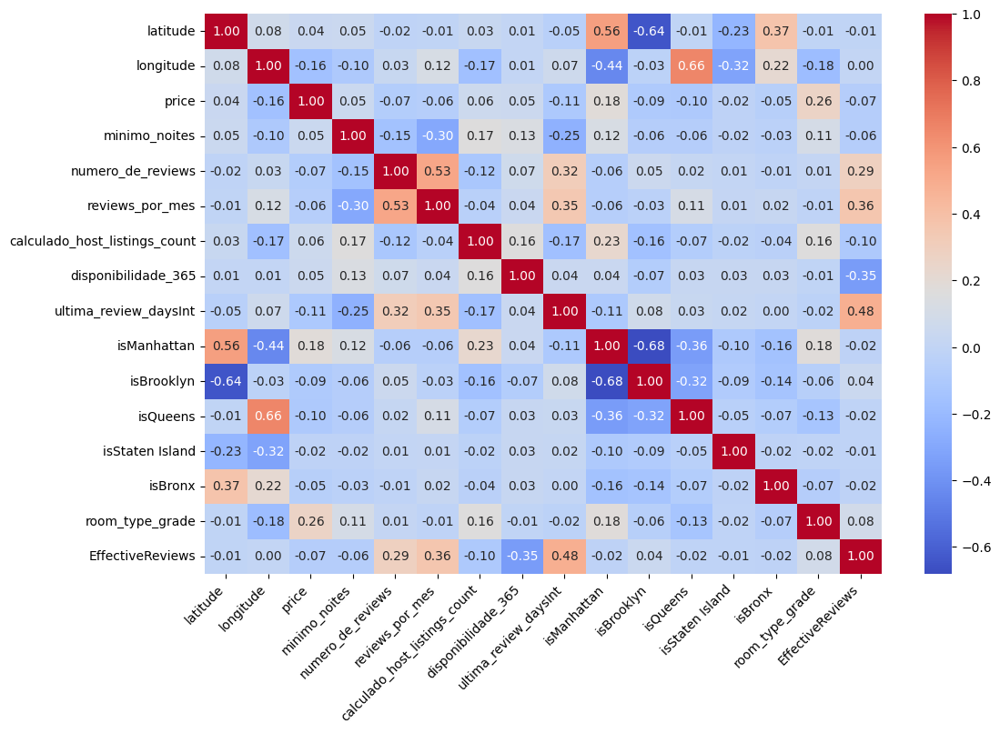

In [18]:

plt.figure(figsize=(12, 8)) #To avoid overlaping data

sns.heatmap(
    normalizedDf.drop(columns = "host_id").corr(
        numeric_only= True
        )
        , annot=True, cmap="coolwarm"
            , fmt=".2f"
            # , fmt=".4f"
        )
plt.xticks(rotation=45, ha="right")  # Diagonal X labels
plt.show()

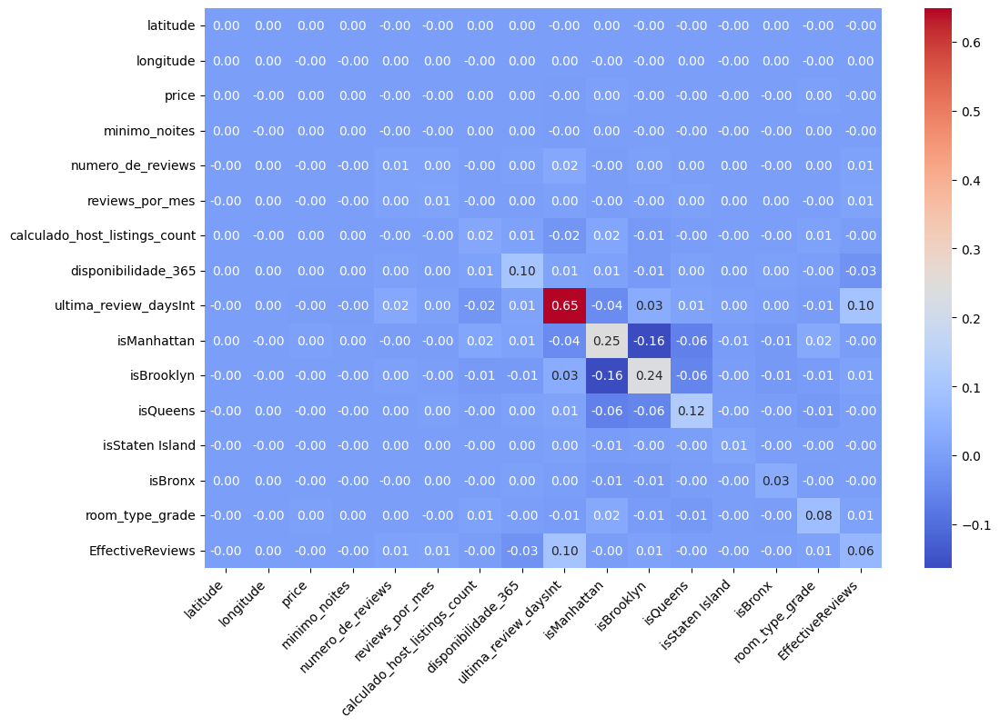

In [19]:
plt.figure(figsize=(12, 8)) #To avoid overlaping data

sns.heatmap(
    normalizedDf.drop(columns = "host_id").cov(
        numeric_only= True
        )
        , annot=True, cmap="coolwarm"
            , fmt=".2f"
            # , fmt=".4f"
        )

plt.xticks(rotation=45, ha="right")  # Diagonal X labels
plt.show()

# Histogram of normalized data

array([[<Axes: title={'center': 'host_id'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'price'}>],
       [<Axes: title={'center': 'minimo_noites'}>,
        <Axes: title={'center': 'numero_de_reviews'}>,
        <Axes: title={'center': 'reviews_por_mes'}>,
        <Axes: title={'center': 'calculado_host_listings_count'}>],
       [<Axes: title={'center': 'disponibilidade_365'}>,
        <Axes: title={'center': 'ultima_review_daysInt'}>,
        <Axes: title={'center': 'isManhattan'}>,
        <Axes: title={'center': 'isBrooklyn'}>],
       [<Axes: title={'center': 'isQueens'}>,
        <Axes: title={'center': 'isStaten Island'}>,
        <Axes: title={'center': 'isBronx'}>,
        <Axes: title={'center': 'room_type_grade'}>],
       [<Axes: title={'center': 'EffectiveReviews'}>, <Axes: >, <Axes: >,
        <Axes: >]], dtype=object)

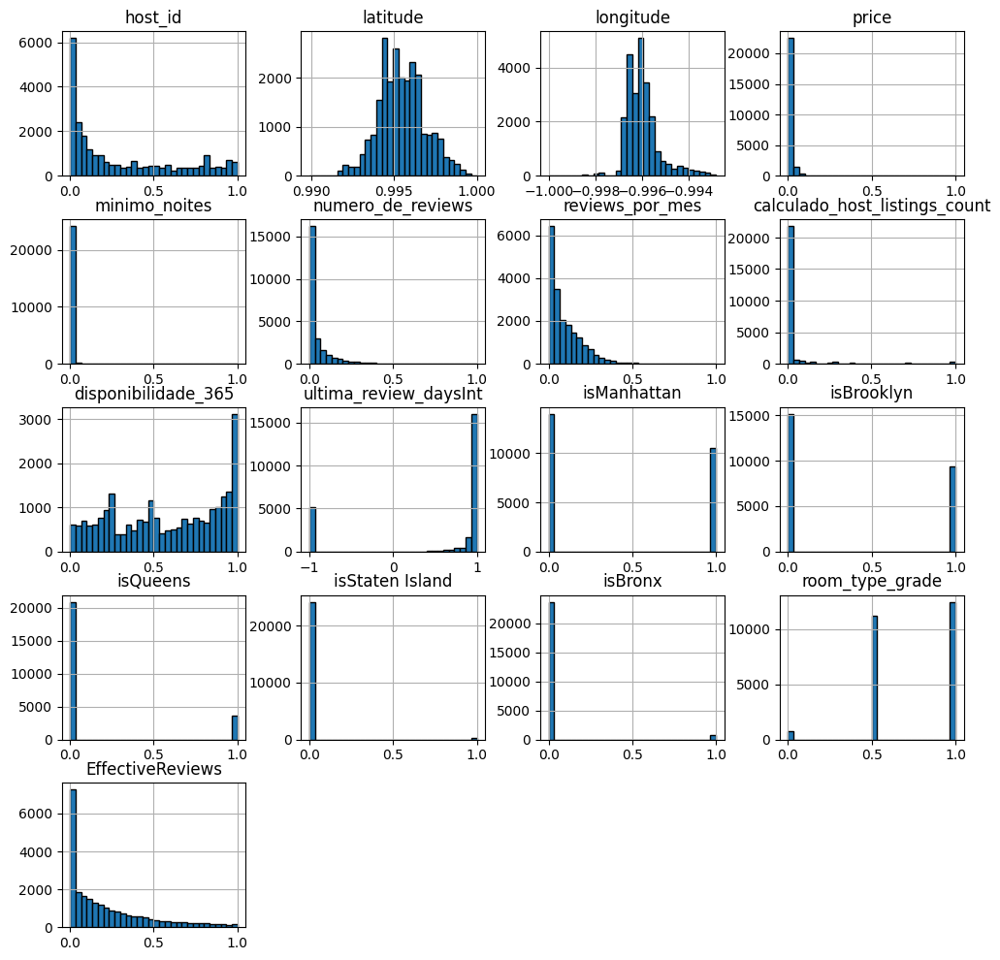

In [20]:
normalizedDf.apply(
    # lambda x: np.log(x + 1.0001)
    lambda x: x
    ).hist(
    figsize=(12, 12), 
    bins=30, 
    edgecolor="black"
    )

# Pairplot (1v1 data)

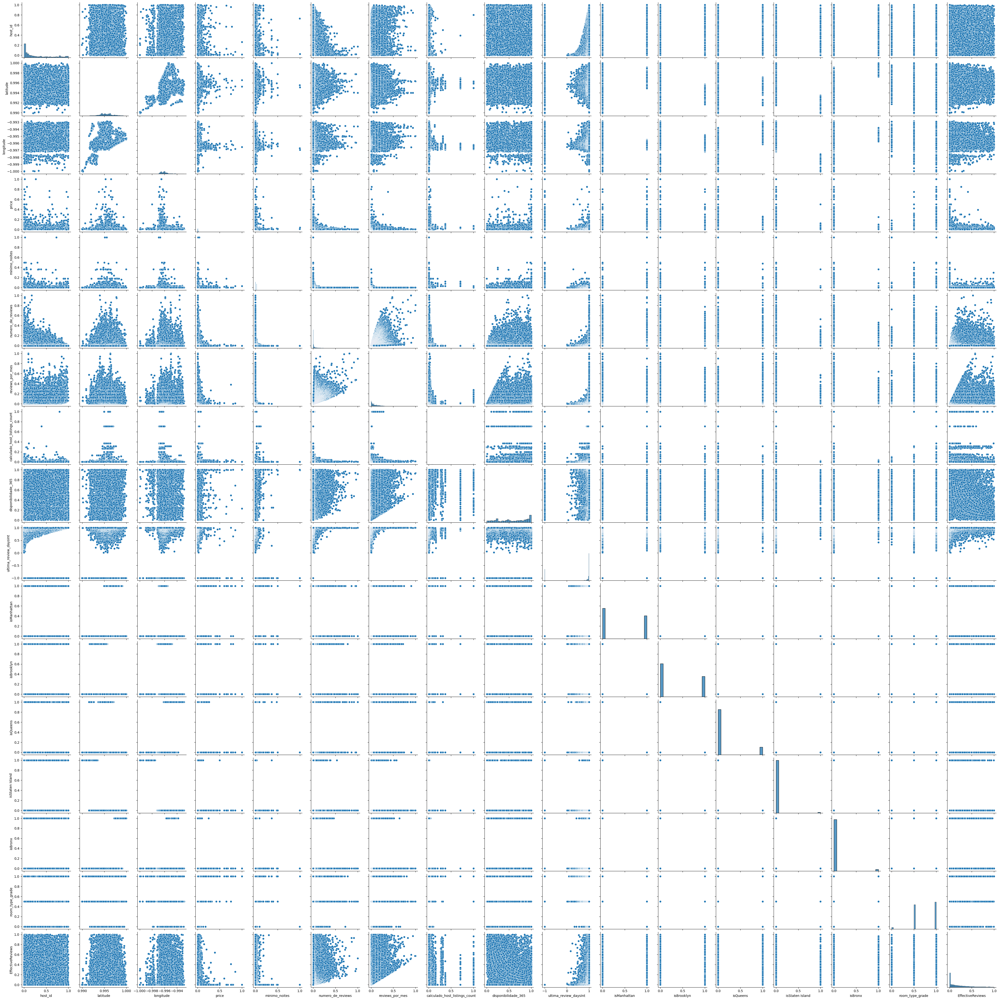

In [21]:
sns.pairplot(normalizedDf)

# Commentaries

## Initial commentaries

It is important to note a few aspects about the data.

While processing the dataset, <font color = "tomato"> we excluded all instances where the price was zero</font>, as these entries likely result from data entry errors. If the dataset were not randomly generated, we imagine such errors could stem from misformatted values (12.56 instead of 12,56) or attempting to input negative numbers.

We also excluded all the impossible values of review, considering the rules of the reservations (which led to the creation of the variable "EffectiveReviews").

We added a few columns to the dataset, such as 'ultima_review_daysInt', 'isManhattan', 'isBrooklyn', 'isQueens', 'isBronx', 'isStaten Island', 'room_type_grade' and 'EffectiveReviews', so that data submitted as a String could be read as a numerical data and would make sense with the dataset. In this sense, room_type_grade and ultima_review_daysInt were ordinal and isManhattan, isBrooklyn, isQueens and isBronx were boolean variables.

A few considerations about the data
- The price variable is <font color = "tomato"> heavily skewed</font>, with a positive skewness, for about 68% of the entries have prices lower than the average.
- Manhattan and Brooklyn concentrate about 81% of all valid entries, as it can be seen below:

| bairro_group   |     count |   cumsum |
|:---------------|----------:|---------:|
| Manhattan      | 0.429372  | 0.429372 |
| Brooklyn       | 0.381128  | 0.810499 |
| Queens         | 0.146245  | 0.956744 |
| Bronx          | 0.0310315 | 0.987775 |
| Staten Island  | 0.0122245 | 1        |

Although weak, the correlations between price and isManhattan (.18), isBrooklyn (-.09), and isQueens (-.10) suggest:

i) Listings in Manhattan tend to be more expensive than the average.

ii) Listings in Brooklyn and Queens are generally more affordable than average.

- The highest correlation in the price data is between price and room_type_grade (.26). It suggests private or shared rooms are cheaper than houses and apartments.

- Higher availability shows a slight positive correlation with price, indicating that listings available for longer periods tend to be more expensive.

- Finally, there is a small negative correlation between the time since the last review and price. If we were to assume that listings with more reviews and with more recent reviews are visited more, that would indicate that cheaper accommodations receive more reservations than pricier ones.

## Considerations for the model

As we are modeling the data, we will make the following assumptions:

- In the market, there are suppliers and buyers. The goal of the supplier is to provide the highest number of rooms for the highest price and for the highest number of days. 
- We will attempt to estimate price by using statistical analysis of the relation between the other variables and <font color = "tomato">price</font>. 
- We will attempt to estimate the number of days by using the data reated to <font color = "tomato">EffectiveReviews</font>.

# OLS

# Preparation
Firstly, we'll get the numerical dat ain the df:

In [22]:
#Get the df
numericalDF = df[df.max(numeric_only=True).index].drop(
    columns = ["host_id", "latitude", "longitude"] # We're eliminating the latitude and longitude for now
    ).fillna(0)

# Get the columns
numericalCols = numericalDF.columns

# Get the indices
numericalIndices = numericalDF.index

display(numericalDF.head().T)

id,2595,3647,3831,5099,5178
price,225.000000,150.0,89.000000,200.000000,79.000000
minimo_noites,1.000000,3.0,1.000000,3.000000,2.000000
numero_de_reviews,45.000000,0.0,270.000000,74.000000,430.000000
reviews_por_mes,0.380000,0.0,4.640000,0.590000,3.470000
calculado_host_listings_count,2.000000,1.0,1.000000,1.000000,1.000000
disponibilidade_365,355.000000,365.0,194.000000,129.000000,220.000000
ultima_review_daysInt,0.984127,-1.0,0.999008,0.994709,0.995370
isManhattan,1.000000,1.0,0.000000,1.000000,1.000000
isBrooklyn,0.000000,0.0,1.000000,0.000000,0.000000
isQueens,0.000000,0.0,0.000000,0.000000,0.000000


Since we are interested in maximizing price and EffectiveReviews, we'll run a Lasso and check which variables will be important for our analysis

In [23]:
Xcols = numericalDF.drop(columns=["price", "EffectiveReviews"]).columns
X = numericalDF[Xcols] # Define X
yPrice = numericalDF.price # Target price
yReviews = numericalDF.EffectiveReviews # Target EffectiveReviews

# Standardize if not ((x-\mu)/s)
scaler = StandardScaler()
XScaled = scaler.fit_transform(X)

# Price LASSO
lassoPrice = LassoCV(cv=5, random_state=42, max_iter=10000)
lassoPrice.fit(XScaled, yPrice)

# Review LASSO
lassoReviews = LassoCV(cv=5, random_state=42, max_iter=10000)
lassoReviews.fit(XScaled, yReviews)

lassoCoefPrice = pd.Series(lassoPrice.coef_, index=X.columns)
lassoCoefReviews = pd.Series(lassoReviews.coef_, index=X.columns)

# Get Features
featuresPrice = lassoCoefPrice[
    # lassoCoefPrice != 0
    :
    ]#.sort_values(ascending=False)
featuresReviews = lassoCoefReviews[
    # lassoCoefReviews != 0
    :
    ]#.sort_values(ascending=False)


# Lasso
print(div, "LASSO - Price:", sep = "\n")
display(featuresPrice.to_frame())

print(div, "LASSO - EffectiveReviews", sep = "\n")
display(featuresReviews.to_frame())



--------------------------------------------------------------------------------
LASSO - Price:


,0
minimo_noites,-2.695176
numero_de_reviews,-10.705736
reviews_por_mes,-0.113022
calculado_host_listings_count,-4.645947
disponibilidade_365,13.142796
ultima_review_daysInt,-19.647013
isManhattan,32.095018
isBrooklyn,0.000000
isQueens,-5.217598
isStaten Island,-0.000000


--------------------------------------------------------------------------------
LASSO - EffectiveReviews


,0
minimo_noites,0.037114
numero_de_reviews,0.001514
reviews_por_mes,0.090792
calculado_host_listings_count,0.004932
disponibilidade_365,-0.100624
ultima_review_daysInt,0.093019
isManhattan,0.004509
isBrooklyn,0.000000
isQueens,-0.007389
isStaten Island,-0.002417


## Regression

In [24]:
# Pick the LASSO features from price and EffectiveReviews
priceFeatures = (featuresPrice != 0).index
reviewFeatures = (featuresReviews != 0).index

# Load X with intercept
XPrice = sm.add_constant(X[priceFeatures]) # Add I*1
XReviews = sm.add_constant(X[reviewFeatures])

In [25]:
# PriceOLS
olsPrice = sm.OLS(yPrice, XPrice).fit()
display(olsPrice.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.102
Model:                            OLS   Adj. R-squared:                  0.102
Method:                 Least Squares   F-statistic:                     253.6
Date:                Tue, 11 Feb 2025   Prob (F-statistic):               0.00
Time:                        22:00:14   Log-Likelihood:            -1.7056e+05
No. Observations:               24459   AIC:                         3.411e+05
Df Residuals:                   24447   BIC:                         3.412e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                           -27.9298      5.552     -5.031      0.000     -38.811     -17.048
minimo_noites                    -0.4023      0.088     -4.595      0.000      -0.574      -0.231
numero_de_reviews                -0.2703      0.040     -6.716      0.000      -0.349      -0.191
reviews_por_mes                  -0.6917      1.359     -0.509      0.611      -3.356       1.972
calculado_host_listings_count    -0.2228      0.039     -5.715      0.000      -0.299      -0.146
disponibilidade_365               0.1598      0.015     10.797      0.000       0.131       0.189
ultima_review_daysInt           -28.9791      2.354    -12.311      0.000     -33.593     -24.365
isManhattan                      64.6342      3.993     16.186      0.000      56.807      72.461
isBrooklyn                       -3.6330      3.902     -0.931      0.352     -11.281       4.015
isQueens                        -26.7314      4.765     -5.610      0.000     -36.071     -17.392
isStaten Island                 -24.4948     12.645     -1.937      0.053     -49.279       0.290
isBronx                         -37.7048      8.300     -4.543      0.000     -53.973     -21.436
room_type_grade                 234.3855      6.105     38.390      0.000     222.419     246.352
==============================================================================
Omnibus:                    49812.893   Durbin-Watson:                   1.786
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        197439419.467
Skew:                          16.994   Prob(JB):                         0.00
Kurtosis:                     441.838   Cond. No.                     2.31e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.71e-26. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [26]:
# EffectiveReviewsOLS
olsReviews = sm.OLS(yReviews, XReviews).fit()
display(olsReviews.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       EffectiveReviews   R-squared:                       0.502
Model:                            OLS   Adj. R-squared:                  0.502
Method:                 Least Squares   F-statistic:                     2241.
Date:                Tue, 11 Feb 2025   Prob (F-statistic):               0.00
Time:                        22:00:14   Log-Likelihood:                 8116.2
No. Observations:               24459   AIC:                        -1.621e+04
Df Residuals:                   24447   BIC:                        -1.611e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             0.1657      0.004     44.425      0.000       0.158       0.173
minimo_noites                     0.0019   5.88e-05     31.665      0.000       0.002       0.002
numero_de_reviews              3.326e-05   2.71e-05      1.229      0.219   -1.98e-05    8.63e-05
reviews_por_mes                   0.0567      0.001     62.100      0.000       0.055       0.059
calculado_host_listings_count     0.0001   2.62e-05      4.409      0.000    6.42e-05       0.000
disponibilidade_365              -0.0009   9.94e-06    -88.158      0.000      -0.001      -0.001
ultima_review_daysInt             0.1159      0.002     73.251      0.000       0.113       0.119
isManhattan                       0.0522      0.003     19.446      0.000       0.047       0.057
isBrooklyn                        0.0430      0.003     16.383      0.000       0.038       0.048
isQueens                          0.0214      0.003      6.668      0.000       0.015       0.028
isStaten Island                   0.0185      0.008      2.179      0.029       0.002       0.035
isBronx                           0.0307      0.006      5.509      0.000       0.020       0.042
room_type_grade                   0.0598      0.004     14.583      0.000       0.052       0.068
==============================================================================
Omnibus:                     4784.575   Durbin-Watson:                   1.928
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11213.673
Skew:                           1.107   Prob(JB):                         0.00
Kurtosis:                       5.471   Cond. No.                     2.31e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.71e-26. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [2], statsmodels alerted us for the possible multicolinearity problem of our dataset, which could lead to overFitting. To solve this, we can [Run a test for Multicolinearity](https://www.geeksforgeeks.org/detecting-multicollinearity-with-vif-python/).

We'll see the main issue is that isManhattan and isBrooklyn concentrate about 80% of observations (hence the multicolinearity).

In [27]:
def testVIF(X: pd.DataFrame):
    XVif = X
    vifDict = dict()

    for i, col in enumerate(XVif.columns):
        vifDict[col] = variance_inflation_factor(XVif.values, i)


    vifDict = pd.DataFrame(vifDict, index= ["Vif"]).T.sort_values("Vif")

    return vifDict

pd.concat(
    [
        testVIF(XPrice[priceFeatures]),
        testVIF(XReviews[reviewFeatures])
        ], axis = 1)

,Vif,Vif
disponibilidade_365,1.064485,1.064485
room_type_grade,1.066986,1.066986
minimo_noites,1.136489,1.136489
calculado_host_listings_count,1.142047,1.142047
isStaten Island,1.148901,1.148901
ultima_review_daysInt,1.316098,1.316098
isBronx,1.322184,1.322184
numero_de_reviews,1.540507,1.540507
reviews_por_mes,1.741190,1.741190
isQueens,2.545200,2.545200


# Questions

## 2 - a)

Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, onde seria mais indicada a compra?

Resposta: Considerando os dados da dinâmica, o que foi assumido sobre a pessoa e a análise feita com os dados, alguém que esteja disposto a investir nesse mercado deveria priorizar uma <font color = "tomato">casa/apartamento</font> em <font color = "tomato"> Manhattan</font> e deveria oferecer o aluguel pelo <font color = "tomato">maior período de tempo durante o ano</font>.

Note que essa resposta leva em consideração que o investidor maximiza o uso efetivo do imóvel (através de EffectiveReviews) e o preço do aluguel, por noite. Dados como o preço de compra de imóveis

## 2 - b)

Sim, de acordo com a regressão, ambos parecem influenciar o preço final do aluguel. De acordo com a regressão olsPrice, o aumento no número de dias mínimos para locação possui um parâmetro de $-.4$, ou seja, mantidas as outras variáveis constantes, o modelo sugere que o aumento no número mínimo de dias influencia negativamente o preço do aluguel.

Já no caso da disponibilidade, o coeficiente encontrado foi de .16 em relação ao preço, ou seja, espera-se que o aumento na disponibilidade do aluguel durante o ano aumente o preço da locação do imóvel.


In [28]:
display(olsPrice.params[["minimo_noites", "disponibilidade_365"]])

minimo_noites         -0.402270
disponibilidade_365    0.159762
dtype: float64

## 2 - c)

Considerando os dados limpos em $df$ e as colunas "nome" e "price", podemos ordenar as palavras usadas em nomes de hotel e contar a sua frequência, [conforme descrito em aqui](https://stackoverflow.com/questions/20510768/count-frequency-of-words-in-a-list-and-sort-by-frequency).

Segue o código para a aplicação do método:

In [29]:
aux = df[["nome", "price"]].sort_values("price", ascending= False)

lines = str()

# How many results to stop
breakPoints = [100, 500, 1500, 2500, 4000, 5000, 7000]

# Save it into a dict
frequency_results = dict()

for num, (ind, line) in enumerate(aux.iterrows()):
    lines += " " + str(line["nome"])
    # Save it when we reach a breakpoint
    if num in breakPoints:
        lines = unidecode.unidecode(lines.lower()) # Remove any strange characters
        lines = re.sub(
            r"[^\w\s]", # Remove escape char
            '',
            lines
        )

        # Now, get the frequency
        frequency = Counter(lines.split())

        # Store results in dictionary with the breakpoint as key
        frequency_results[num] = dict(frequency.most_common(20))

freq_df = pd.DataFrame.from_dict(frequency_results, orient="index").fillna(0)


<Axes: >

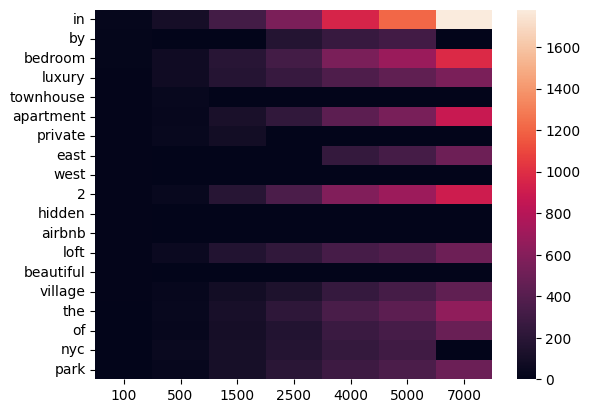

In [30]:
display(sns.heatmap(freq_df.T.iloc[:19]))

<Axes: >

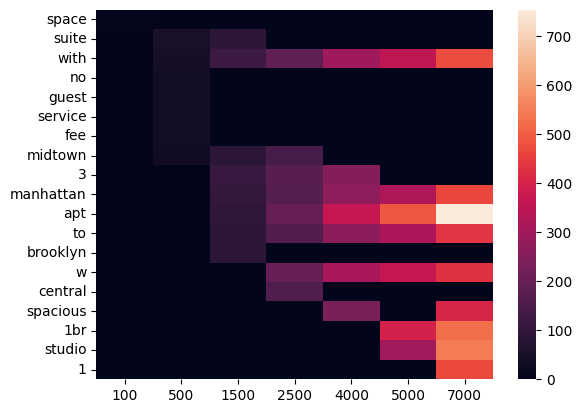

In [31]:
display(sns.heatmap(freq_df.T.iloc[19:]))

Após a contagem das palavras usadas nos nomes dos apartamentos mais caros, descobrimos que as palavras mais usadas em ofertas de aluguel com preço elevado são as seguintes:
- village;
- loft;
- Manhattan;
- studio;
- bedroom;
- luxury;
- apartment;
- east.

## 3)

Considerando que usamos o modelo de regressão linear em olsPrice e o modelo nos retorna os parâmetros que melhor explicam o preço do apartamento, a previsão é feita multiplicando estes parâmetros pelo valor observado dos coeficientes (na questão 4 faremos um exemplo).

Para poder fazer a regressão, foi necessária a revisão e o tratamento dos dados, excluindo observações impossíveis, visualizando as posições das ofertas de aluguel e gerando novas variáveis a partir daquelas que não poderiam ser diretamente convertidas em numéricas (para poder realizar a OLS é importante que os dados sejam independentes, não sejam nulos e sejam numéricos). Ainda, usamos o Lasso para nos certificarmos sobre a utilidade de incluir as variáveis no modelo e, ao final, usamos o VIF para testar a multicolinearidade dos dados em X.

O problema que resolvemos foi um problema de regressão linear, que é típico de situações onde queremos explicar o comportamento de uma variável a partir de outras de forma linear, além de ser não-enviesado, super simples de implementar e de interpretar os resultados. Os "contras" desse modelo são, principalmente, os conjuntos de condições que precisamos assumir sobre os dados para que o OLS seja significativo, além da sua incapacidade de explicar relações não lineares.

Para o benchmark do modelo, usa-se o $r^2$, ou r-squared, que indica o grau de significância do modelo (por exemplo, caso o $r^2$ seja de $40\%$, espera-se que o modelo seja capaz de explicar $40\%$ da variação de $y$ pela sua relação linear com $X$.) 

Na regressão para o preço, encontramos um $r^2$ baixo, de aproximadamente $10\%$, ou seja, com baixo poder de explicação sobre o preço. Porém, a verificação das estatísticas das variáveis que foram indicadas pelo OLS (como a disponibilidade, localização em Manhattan e o tipo de imóvel), além da confirmação visual através dos mapas e da correlação dessas variáveis com o preço indicam que haja sim a variação do preço através da perturbação dessas variáveis, exatamente na mesma direção que indica o modelo.

Já na regressão para as Reviews efetivas dos apartamentos, o grau de explicação do OLS foi de $\sim 50\%$, ou seja, houve um alto grau de explicação para a variação de $y$ em relação a $X$.

## 4)

Considerando a análise e o fato de este apartamento já estar presente no DataSet, basta localizar a entrada em xPrice e fazer o somatório do produto entre os coeficientes e os parâmetros da regressão. Em suma, fazemos o seguinte:


In [32]:
Coeficients = XPrice.loc[2595]
Parameters = olsPrice.params
Parts = Coeficients * Parameters
Result = Parts.sum()

print("Preço sugerido:", "{:.2f}".format(Result))

Preço sugerido: 286.01
